## Foundations of Data Mining: Assignment 2

Please complete all assignments in this notebook. You should submit this notebook, as well as a PDF version (See File > Download as).

In [88]:
# Please fill in your names here
NAME_STUDENT_1 = ""
NAME_STUDENT_2 = ""

In [89]:
%matplotlib inline
from preamble import *
plt.rcParams['savefig.dpi'] = 100 # This controls the size of your figures
# Comment out and restart notebook if you only want the last output of each cell.
InteractiveShell.ast_node_interactivity = "all" 
HTML('''<style>html, body{overflow: visible !important} .CodeMirror{min-width:105% !important;} .rise-enabled .CodeMirror, .rise-enabled .output_subarea{font-size:140%; line-height:1.2; overflow: visible;} .output_subarea pre{width:110%}</style>''') # For slides

## Support Vector Bananas (4 points (2+2))
We will first explore SVM kernels and hyperparameters on an artificial dataset representing multiple banana shapes. 

In [161]:
from sklearn.model_selection import *
bananas = oml.datasets.get_dataset(1460) # Download banana data
bananas_X, bananas_y = bananas.get_data(target=bananas.default_target_attribute);
bananas_X_train, bananas_X_test, bananas_y_train, bananas_y_test = train_test_split(bananas_X, bananas_y, random_state=0, test_size=1/4)

1 . Evaluate how well an SVM classifier can fit the data. 

- Use a linear, polynomial and radial basis function (RBF) kernel, using their default hyperparameters. Evaluate the performance of each kernel using the test set and AUC. Which one works best? 
- Visualize the results using the visualization code also used in class (under mglearn/plot_svm.py > plot_svm_kernels). Also show the AUC score and the number of support vectors. Explain intuitively how well the data is fitted, why the kernel is (not) able to fit the data, whether it is under- or overfitting, etc.

In [162]:
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score

svm_linear = SVC(kernel='linear').fit(bananas_X_train, bananas_y_train)
linear_score = svm_linear.score(bananas_X_test, bananas_y_test)
linear_auc_score = roc_auc_score(bananas_y_test, svm_linear.decision_function(bananas_X_test))

svm_poly = SVC(kernel='poly').fit(bananas_X_train, bananas_y_train)
poly_score = svm_poly.score(bananas_X_test, bananas_y_test)
poly_auc_score = roc_auc_score(bananas_y_test, svm_poly.decision_function(bananas_X_test))

svm_rbf = SVC(kernel='rbf').fit(bananas_X_train, bananas_y_train)
rbf_score = svm_rbf.score(bananas_X_test, bananas_y_test)
rbf_auc_score = roc_auc_score(bananas_y_test, svm_rbf.decision_function(bananas_X_test))

print("Linear score: " + str(linear_score))
print("Linear auc score: " + str(linear_auc_score))
print("Poly score: " + str(poly_score))
print("Poly auc score: " + str(poly_auc_score))
print("RBF score: " + str(rbf_score))
print("RBF auc score: " + str(rbf_auc_score))

Linear score: 0.5471698113207547
Linear auc score: 0.5056551724137931
Poly score: 0.6347169811320754
Poly auc score: 0.7546988505747128
RBF score: 0.9139622641509434
RBF auc score: 0.9704781609195402


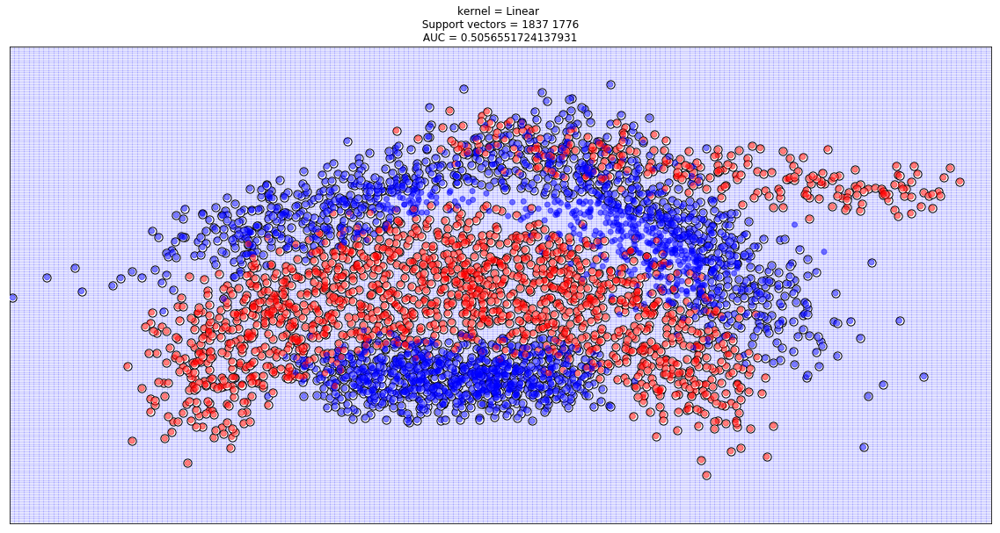

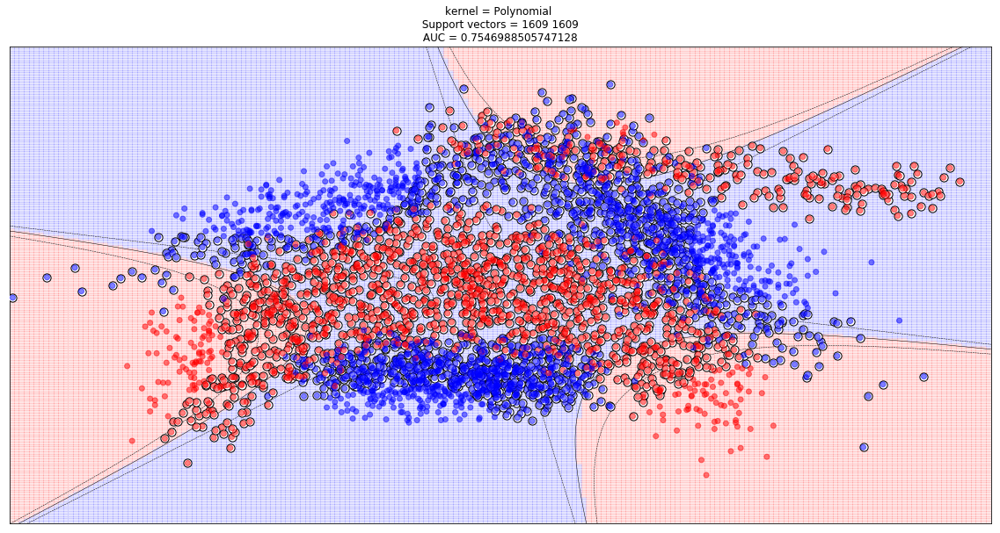

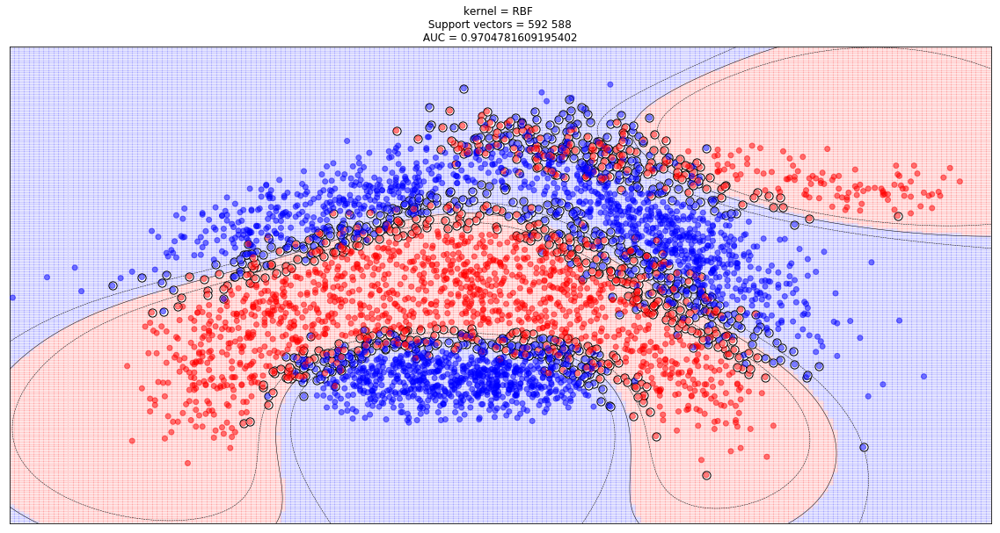

In [163]:
def plot_svm_kernel(svm, name, auc_score):
    # plot the line, the points, and the nearest vectors to the plane

    plt.scatter(svm.support_vectors_[:, 0], svm.support_vectors_[:, 1], s=85, edgecolors='k', c='w', zorder=10)
    plt.scatter(bananas_X_train[:, 0], bananas_X_train[:, 1], c=bananas_y_train, zorder=10, cmap=plt.cm.bwr, alpha=0.5)

    #for i, coef in enumerate(svm.dual_coef_[0]):
        #plt.annotate("%0.2f" % (coef), (svm.support_vectors_[i, 0]+0.15,svm.support_vectors_[i, 1]), fontsize=8, zorder=11)

    plt.axis('tight')
    x_min = -3
    x_max = 3
    y_min = -3
    y_max = 3

    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j]
    Z = svm.decision_function(np.c_[XX.ravel(), YY.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(XX.shape)
    
    plt.pcolormesh(XX, YY, Z > 0, cmap=plt.cm.bwr, alpha=0.1)
    plt.contour(XX, YY, Z, colors=['k', 'k', 'k'], linestyles=['--', '-', '--'],
                levels=[-.5, 0, .5])

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

    plt.xticks(())
    plt.yticks(())
    
    plt.title('kernel = {} \n Support vectors = {d[0]} {d[1]} \n AUC = {} '.format(name, auc_score, d=svm.n_support_))
    
plt.figure(1, figsize=(20, 10))
plot_svm_kernel(svm_linear, "Linear", linear_auc_score)
plt.figure(2, figsize=(20, 10))
plot_svm_kernel(svm_poly, "Polynomial", poly_auc_score)
plt.figure(3, figsize=(20, 10))
plot_svm_kernel(svm_rbf, "RBF", rbf_auc_score)
plt.show()

As can be seen from the scores, RBF largely outperforms the linear and polynomial kernels. Because of the colored background in the graphs, it is visible that the linear kernel does not have positions for the red dots, so it classifies everything as blue and hence the score of 50%. This is not unexpected, since the data cannot be linearily divided.

The polynomial kernel does a little bit better job, as it has some areas of red. But these areas do also have blue points in them and therefore the score is not increasing much. Both the linear and polynomial kernel are underfitting.

The RBF kernel does a very good job, because it can give very specific boundaries for classes. However, it is overfitting a little bit because of that.

2 . Pick the RBF kernel and optimize the two most important hyperparameters (the $C$ parameter and the kernel width $\gamma$). 

- First, optimize manually using 3 values for each (a very small, default, and very large value). For each of the 9 combinations, create the same RBF plot as before, report the number of support vectors, and the AUC performance. Explain the performance results. When are you over/underfitting?
- Next, optimize the hyperparameters using a grid search and 10-fold cross validation. Show a heatmap of the results snd report the optimal hyperparameter values.
    - Hint: values for C and $\gamma$ are typically in [$2^{-15}..2^{15}$] on a log scale. Use at least 10 values for each.

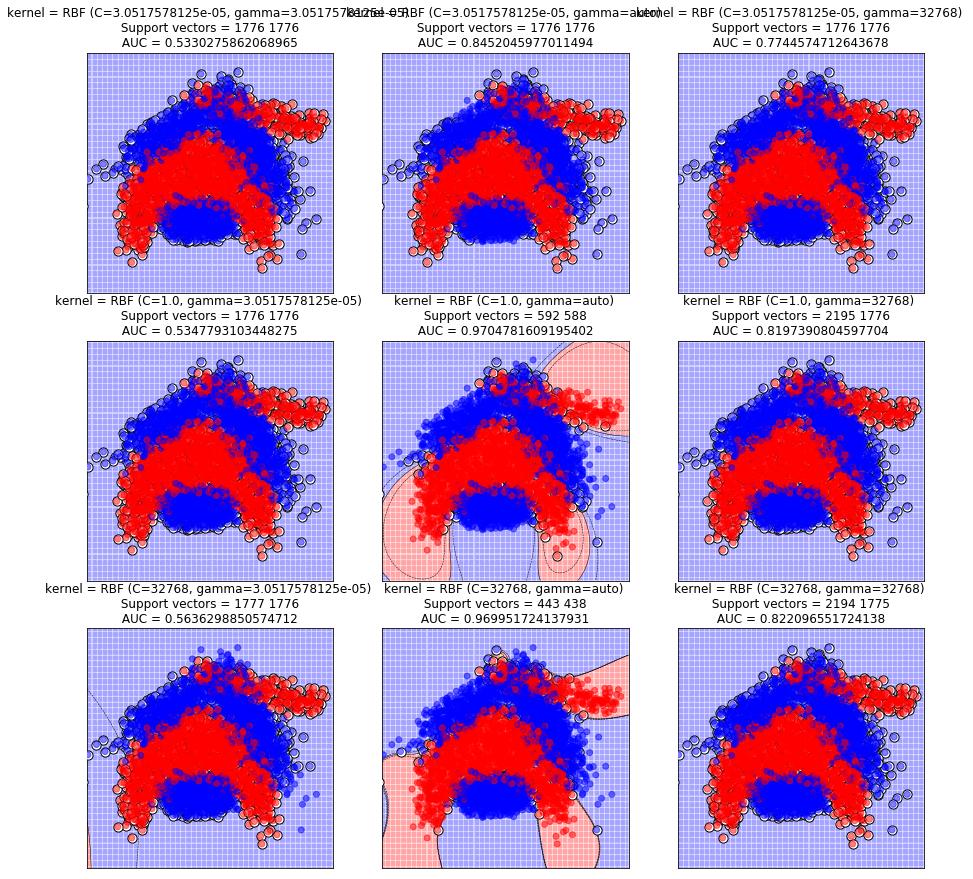

In [164]:
fig = plt.figure(figsize=(15,15)) 

fignum = 1

for C in [2**-15, 1.0, 2**15]:
    for gamma in [2**-15, 'auto', 2**15]:
        svm_rbf = SVC(kernel='rbf', C=C, gamma=gamma).fit(bananas_X_train, bananas_y_train)
        rbf_auc_score = roc_auc_score(bananas_y_test, svm_rbf.decision_function(bananas_X_test))
        ax = fig.add_subplot(3, 3, fignum)
        plt.sca(ax)
        plot_svm_kernel(svm_rbf, "RBF (C={}, gamma={})".format(C, gamma), rbf_auc_score)
        fignum = fignum + 1
        
plt.show()

Most of the given settings result in underfitting, as the backgrounds are mostly blue. The plots for gamma=auto seem to be working well when C is positive. Both these plots have a good score and are not particularely overfitting.
The plot for C=1, gamma=30 is overfitting however. This is because it has too specific areas of red. The best performance is for the values C = 1.0 and gamma = auto.

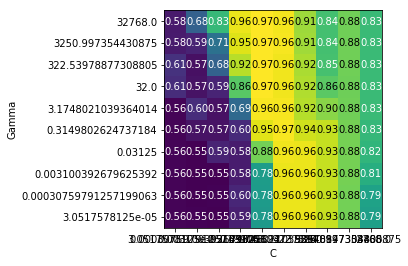

In [165]:
from sklearn.model_selection import GridSearchCV 
from sklearn.svm import SVC
import numpy as np

logs = np.logspace(-15, 15, 10, base=2)
param_grid = {'C': logs, 'gamma': logs}

grid_search = GridSearchCV(SVC(), param_grid, cv=10, scoring="roc_auc", n_jobs=-1)
grid_search.fit(bananas_X_train, bananas_y_train)

results = pd.DataFrame(grid_search.cv_results_)

scores = np.array(results.mean_test_score).reshape(param_grid['gamma'].size, param_grid['C'].size)

mglearn.tools.heatmap(scores, xlabel='C', xticklabels=param_grid['C'],
                      ylabel='Gamma', yticklabels=param_grid['gamma'], cmap="viridis");

In [168]:
print("Score {} for params: {}".format(grid_search.best_score_, grid_search.best_params_))

Score 0.9685217193452662 for params: {'C': 322.53978877308805, 'gamma': 0.3149802624737184}


## Building Kernels (4 points (0.5+0.5+1+2))

Consider the artificial dataset given below. It represents a sine wave with added noise.

1. Fit an SVM Regressor with the default RBF kernel, and plot the predictions on all data points in [0, 40]. 

    - Does it fit the data well? Does it extrapolate well (in the range [30,40])? Explain your findings. 
    - Can you get better results by tweaking the kernel or the other SVM parameters?
    
2. Implement your own linear kernel. This is a function that takes 2 vectors (arrays) and returns the dot product:

      $$k(\mathbf{x}_i,\,\mathbf{x}_j) = \mathbf{x}_i \cdot \mathbf{x}_j$$
    - Build an SVM regressor using that kernel by passing your kernel function as the `kernel` hyperparameter. 
    - Fit it on the sine data and plot the predictions on all data points. Interpret the results.
    
3. Since this data is periodic, it makes sense to implement a periodic kernel instead. 

    - This is the Exponential Sine Squared kernel, with length scale $\Gamma$ and periodicity $P$:
  $$k(\mathbf{x}_i,\,\mathbf{x}_j) = \exp \left( -\Gamma\,\sin^2\left[\frac{\pi}{P}\,\left|\left|x_i-x_j\right|\right|\right]\right)$$
    - Implement it, using the defaults $\Gamma=1$, periodicity $P=1$, and Euclidean distance.
    - Train an SVM regressor with it, fit in on the same data and plot the result. Interpret the outcome. 
    - Think about what $\Gamma$ and $P$ represent. Can you improve the fit by manually adjusting them? Explain your findings.
    - Optimize $\Gamma$ and periodicity $P$ (using `true_y` as the ground truth). Use a grid search or random search, $\Gamma \in [0,1]$, $P \in [1,100]$, try at least 5 values for each.

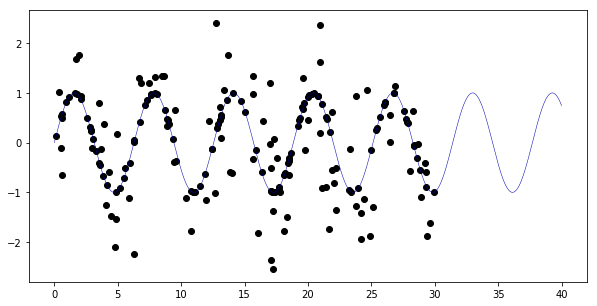

In [129]:
# Generate sample data
rng = np.random.RandomState(0) # Random seed, for reproducibility 
random_X = 30 * rng.rand(200, 1)
random_y = np.sin(random_X).ravel() 
random_y[::2] += rng.normal(scale = 1.0, size = random_X.shape[0] // 2) # adds noise

X_plot = np.linspace(0, 40, 10000)[:, None] # A larger range to evaluate on
true_y = np.sin(X_plot) # and the 'true' target function

plt.figure(figsize=(10, 5))
plt.scatter(random_X, random_y, c='k', label='Data')
plt.plot(X_plot, true_y);

## 2.1

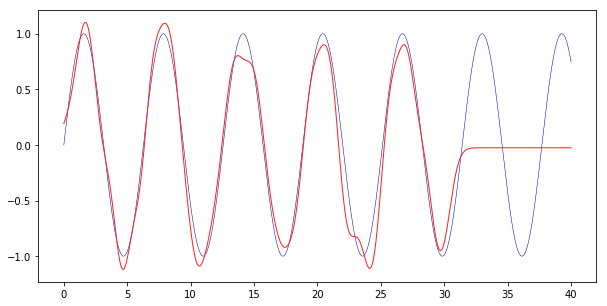

In [130]:
from sklearn.svm import SVR

svr = SVR().fit(random_X, random_y)

predictions = svr.predict(X_plot)

plt.figure(figsize=(10, 5))
plt.plot(X_plot, true_y);
plt.plot(X_plot, predictions, '-', linewidth=1);

The SVR does not extrapolate at all. It stops predicting after point 30, this is because it is not fitted on data after point 30.
We tried tuning the parameters and got the following results:
- Using any other kernel do not make the predictions better.
- Using lower values for C makes the predictions more "flat".
- Using higher values for C makes the predictions give high values, so more "spiked".
- Using lower or higher values for gamma do not make the predictions better.
- None of the tried settings improved the extrapolation (not unexpected)

The default values seem to be working best, for predictions after $x\geq30$.

## 2.2

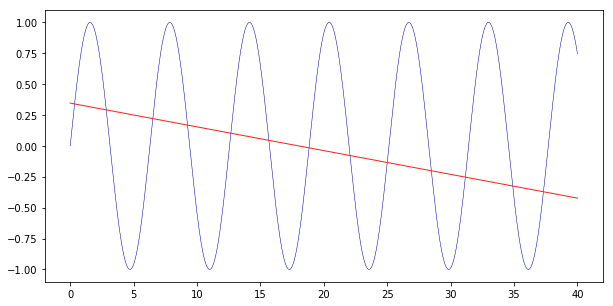

In [131]:
def own_kernel(x, y):
    return np.dot(x, y.reshape(1, -1))
    
from sklearn.svm import SVR

svr = SVR(kernel=own_kernel).fit(random_X, random_y)

predictions = svr.predict(X_plot)

plt.figure(figsize=(10, 5))
plt.plot(X_plot, true_y);
plt.plot(X_plot, predictions, '-', linewidth=1);

The linear kernel does not do a good job, as can be seen. This is because it is not possible to fit a linear function over a sine function

## 2.3

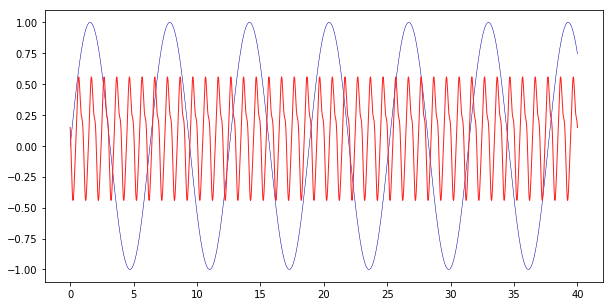

In [146]:
from scipy.spatial.distance import cdist
from sklearn.svm import SVR

def get_kernel(G, P):
    def periodic_kernel(X, Y):
        return np.exp(-G * np.power(np.sin(np.pi / P * cdist(X, Y, metric='euclidean')), 2))
    return periodic_kernel

periodic_kernel = get_kernel(1.0, 1.0)
svr = SVR(kernel=periodic_kernel).fit(random_X, random_y)

predictions = svr.predict(X_plot)

plt.figure(figsize=(10, 5))
plt.plot(X_plot, true_y)
plt.plot(X_plot, predictions, '-', linewidth=1);

The periodic kernel does a better job than the linear kernel. However, the periods of the periodic kernel are too frequent. This could be improved by tuning G and P.

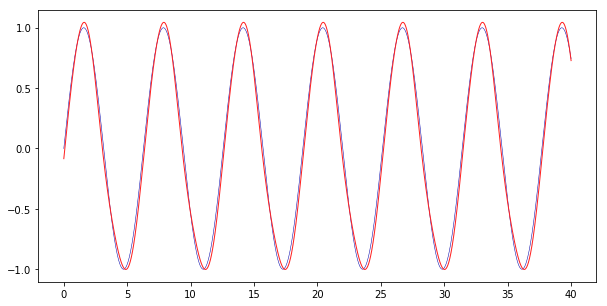

In [147]:
#Custom enhancement

periodic_kernel = get_kernel(1.0, np.pi * 2)
svr = SVR(kernel=periodic_kernel).fit(random_X, random_y)

predictions = svr.predict(X_plot)

plt.figure(figsize=(10, 5))
plt.plot(X_plot, true_y)
plt.plot(X_plot, predictions, '-', linewidth=1);

We tuned the parameter P with a value of pi * 2 and this gives very good results. Because of the value of P, we cancel out the dividing by pi, so the formula becomes $$k(\mathbf{x}_i,\,\mathbf{x}_j) = \exp \left( -\Gamma\,\sin^2\left[\frac{1}{2}\,\left|\left|x_i-x_j\right|\right|\right]\right)$$

With this, the predicted sine has a longer period and tops of 1 and bottoms of -1, which fit very well with the real sine.

In [224]:
from sklearn.model_selection import GridSearchCV

Gs = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]
Ps = [1.0, 2 * np.pi, 20.0, 40.0, 60.0, 80.0, 100.0]

param_grid = {
    'kernel': [
        get_kernel(G, P)
            for G in Gs
            for P in Ps
    ]
}

grid_search_svr = GridSearchCV(SVR(), param_grid=param_grid)
grid_search_svr.fit(random_X, random_y);

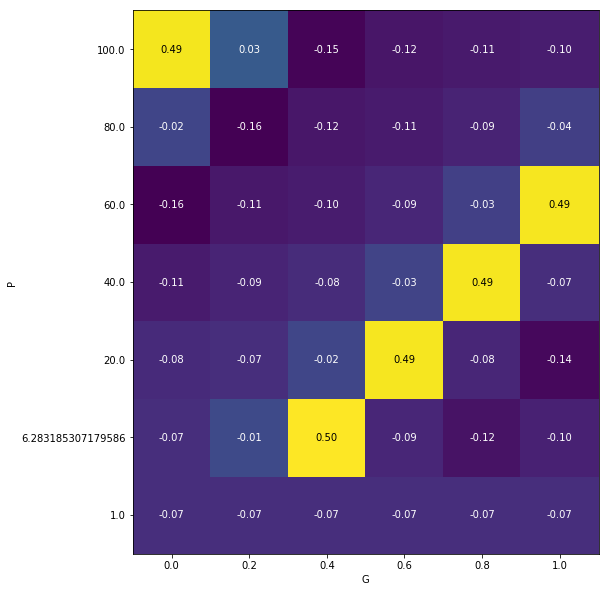

In [225]:
results = pd.DataFrame(grid_search_svr.cv_results_)

scores = np.array(results.mean_test_score).reshape(len(Ps), len(Gs))

plt.figure(figsize=(10,10))
mglearn.tools.heatmap(scores, xlabel='G', xticklabels=Gs,
                      ylabel='P', yticklabels=Ps, cmap="viridis");

4 . We now make the problem a bit more challenging by adding an upward trend:

- Fit the same SVM using the optimal parameters from the previous subtask and plot the results. Do they still work? Explain what you see.
- Fit a Gaussian process (GP) using the kernels given below. First use the singular ExpSineSquared kernel (the implementation provided by sklearn this time), then build a new kernel consisting of the 3 components given below. Use both to predict all points for the "rising noisy sine" data and plot the results as usual. Interpret the results.
    - For the GP, it may help to use `normalize_y=True` since the y-values are not around 0. Setting `alpha=0.1` may help with possible numerical issues, otherwise keep it at 0.
- Also plot the _uncertainty interval_ around the predictions. You can ask the GP to return the standard deviation during prediction with the `return_std=True` hyperparameter. Plot a band 2 standard deviations above and below the prediction. You can use MatPlotLib's `fill_between` as shown in class.
    - You can combine the 3 models in one plot for easy comparison.
- We've provided reasonable values for the kernel hyperparameters above. Can you optimize them further to get an even better fit? Think about what the hyperparameters do and optimize the ones you think are most worth tuning.

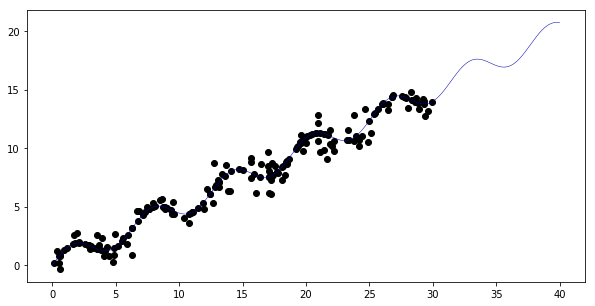

In [153]:
# Generate sample data with added trend
rng = np.random.RandomState(0)
upward_X = 30 * rng.rand(200, 1)
upward_y = upward_X.ravel()/2 + np.sin(upward_X).ravel()
upward_y[::2] += rng.normal(scale = 1.0, size = upward_X.shape[0] // 2)  # add noise

X_plot = np.linspace(0, 40, 10000)[:, None]
true_y = X_plot/2 + np.sin(X_plot)

plt.figure(figsize=(10, 5))
plt.scatter(upward_X, upward_y, c='k', label='Data')
plt.plot(X_plot, true_y);

In [154]:
from sklearn.gaussian_process.kernels import WhiteKernel, ExpSineSquared, RBF

# Replace `length_scale` and `periodicity` with the values found in the previous part.
# In our case this is 0.2 and 100
kernel_simple = ExpSineSquared(length_scale=0.2, periodicity=100) # periodic component

k1 = 4300 * RBF(length_scale=70.0)  # long term smooth rising trend
k2 = 6 * RBF(length_scale=90.0) * ExpSineSquared(length_scale=1.3, periodicity=1.0)  # periodic component
k3 = 0.03 * RBF(length_scale=0.134) + WhiteKernel(noise_level=0.035)  # noise terms

## Fitting the optimal SVM from 2.3

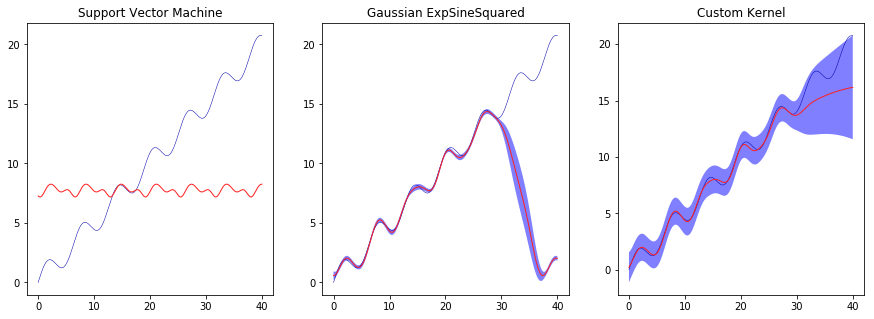

In [231]:
from sklearn.gaussian_process import GaussianProcessRegressor

#SVM
periodic_kernel = get_kernel(1.0, np.pi * 2)
svr = SVR(kernel=periodic_kernel).fit(upward_X, upward_y)

predictions_svr = svr.predict(X_plot)

#simple kernel
gp = GaussianProcessRegressor(kernel=kernel_simple, normalize_y=True, n_restarts_optimizer=10, alpha=0.1)

gp.fit(upward_X, upward_y)

predictions_simple, sigma_simple = gp.predict(X_plot, return_std=True)

#custom kernel

awesome_kernel = k1+ k2 + k3

gp = GaussianProcessRegressor(kernel=awesome_kernel, normalize_y=True, n_restarts_optimizer=10, alpha=0.1)

gp.fit(upward_X, upward_y)

predictions_awesome, sigma_awesome = gp.predict(X_plot, return_std=True)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(X_plot, true_y)
plt.plot(X_plot, predictions_svr, '-', linewidth=1)
plt.title("Support Vector Machine")

plt.subplot(1, 3, 2)

plt.plot(X_plot, true_y)
plt.plot(X_plot, predictions_simple, '-', linewidth=1)
plt.fill(np.concatenate([X_plot, X_plot[::-1]]),
         np.concatenate([predictions_simple - 1.9600 * sigma_simple,
                        (predictions_simple + 1.9600 * sigma_simple)[::-1]]),
         alpha=.5, fc='b', ec='None', label='95% confidence interval')
plt.title("Gaussian ExpSineSquared")

plt.subplot(1, 3, 3)

plt.plot(X_plot, true_y)
plt.plot(X_plot, predictions_awesome, '-', linewidth=1)
plt.fill(np.concatenate([X_plot, X_plot[::-1]]),
         np.concatenate([predictions_awesome - 1.9600 * sigma_awesome,
                        (predictions_awesome + 1.9600 * sigma_awesome)[::-1]]),
         alpha=.5, fc='b', ec='None', label='95% confidence interval')
plt.title("Custom Kernel");

The three graphs above show different regressors for the periodic upward trend. The Support Vector Machine with tuned kernel for sub-quesion 3 does not capture the upward trend of the function. It fits to a small part of the function and extrapolates that as if it is linear, using the mean of the training data. However outside of the range of ~12, ~18 this does not work well.

Meanwhile the `ExpSineSquared` matches the upward function nicely for the training data, however, it does not extrapolate and for the testing data therefore does not accurately the trend of the data. Setting `alpha` for this regressor is needed as there is some noise in the data.

Finally the custom kernel which combines the three provided kernels by using addition is the kernel that shows the best fit. The three kernels components capture the noise, periodicity and upward trend of the data, and the combinations results in something which fits the training data better but which still does not extrapolate very well. For this Guassian process again the `alpha` paremeter is used to account for noise. 

## Tuning the custom kernel

From the plots shown above we concluded that it appears that the periodic component did not correctly match the trend of the data. Therfore we have chosen to optimize the `periodicity` parameter of the `ExpSineSquared` kernel, which is part of the custom kernel.

In [214]:
from sklearn.model_selection import GridSearchCV

def get_custom_awesome_kernel(period):
    k1 = 4300 * RBF(length_scale=70.0)  # long term smooth rising trend
    k2 = 6 * RBF(length_scale=90.0) * ExpSineSquared(length_scale=1.3, periodicity=period)  # periodic component
    k3 = 0.03 * RBF(length_scale=0.134) + WhiteKernel(noise_level=0.035)  # noise terms
    
    return k1 + k2 + k3

periodicity = np.linspace(0.9, 1.1, num=20)

param_grid = {
    'kernel': [
        get_custom_awesome_kernel(period)
            for period in periodicity
    ]
}

grid_search_awesome_kernel = GridSearchCV(GaussianProcessRegressor(normalize_y=True, n_restarts_optimizer=10, alpha=0.1), 
                                                                   n_jobs=-1, param_grid=param_grid, cv=10)

grid_search_awesome_kernel.fit(upward_X, upward_y);

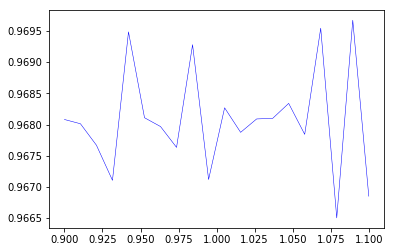

In [215]:
results = pd.DataFrame(grid_search_awesome_kernel.cv_results_)

scores = np.array(results.mean_test_score)

_=plt.plot(periodicity, scores, 'b')
plt.show()

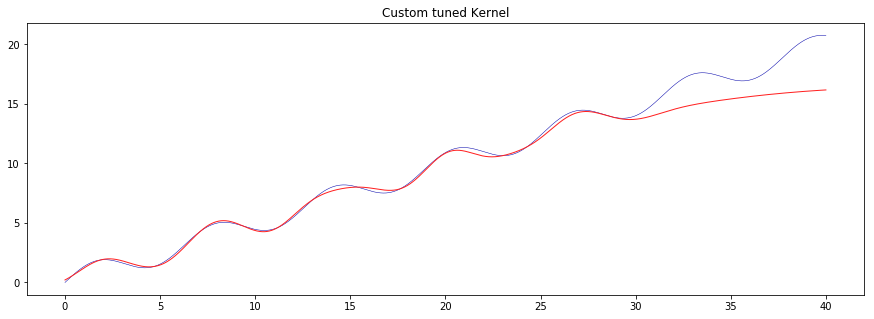

In [217]:
#custom kernel

gp = grid_search_awesome_kernel.best_estimator_

predictions_awesome = gp.predict(X_plot)

plt.figure(figsize=(15, 5))

plt.plot(X_plot, true_y)
plt.plot(X_plot, predictions_awesome, '-', linewidth=1)
plt.title("Custom tuned Kernel");

The above two plots show the results of optimizing the `periodicity`. The first is the result of the grid search, which shows that tuning the `periodicity` only results in relatively small performance gains. 

## Bayesian updates (3 points (2+1))

We consider real data about solar radiation measured by a weather balloon:
https://www.openml.org/d/512. We'll use only the raw data (at least the first 1000 points) and try to learn the (very noisy) trend. 

1. Train a Gaussian process on an increasing amount of samples of the training data. Use a simple RBF kernel:
`RBF(10, (1e-2, 1e2))`

 - Start with 10 _random_ samples and plot the predictions (both the mean and the uncertainty interval) for both training and test data, as shown in class. Also compute $R^2$ on the training data.
 - Repeat and 10 more points, retrain and redraw. Do this a couple of times and interpret/explain what you see. 
 
2. Train the Gaussian on the full training set.

 - Plot the predictions (including the uncertainty interval) on the full dataset. Evaluate on the test set using $R^2$ 
 - Interpret the results. Is the kernel right? Is the GP under/overfitting?
 - Try to improve the results by tuning the kernel. Do this either manually or using a small grid/random search.

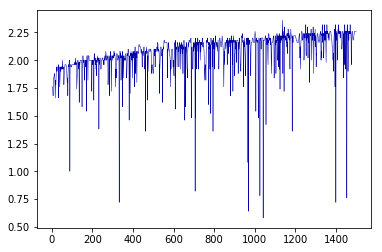

In [191]:
# Get the data
radiation_data = oml.datasets.get_dataset(512) 
radiation_X, radiation_y = radiation_data.get_data(target=radiation_data.default_target_attribute);

radiation_train = radiation_X[:1000]
radiation_test = radiation_X[1000:1500]
radiation_X_train = np.array(list(range(1000)))[np.newaxis].T
radiation_y_train = radiation_X[:1000].reshape(-1, 1)
radiation_X_test = np.array(list(range(1000,1500)))[np.newaxis].T
radiation_y_test = radiation_X[1000:1500].reshape(-1, 1)
radiation_X_all = np.array(list(range(1500)))[np.newaxis].T

pd.Series(radiation_X[:1500,0]).plot()

We first investigate what happens if we use a `GaussianProcessRegressor` and use it to train a random sample of the `radation_X_train` data. 

For 10 samples R^2 is: -0.6925061781552182
For 20 samples R^2 is: -0.2787325565166501
For 30 samples R^2 is: -0.8116641629062196
For 40 samples R^2 is: -1.0018867552750974


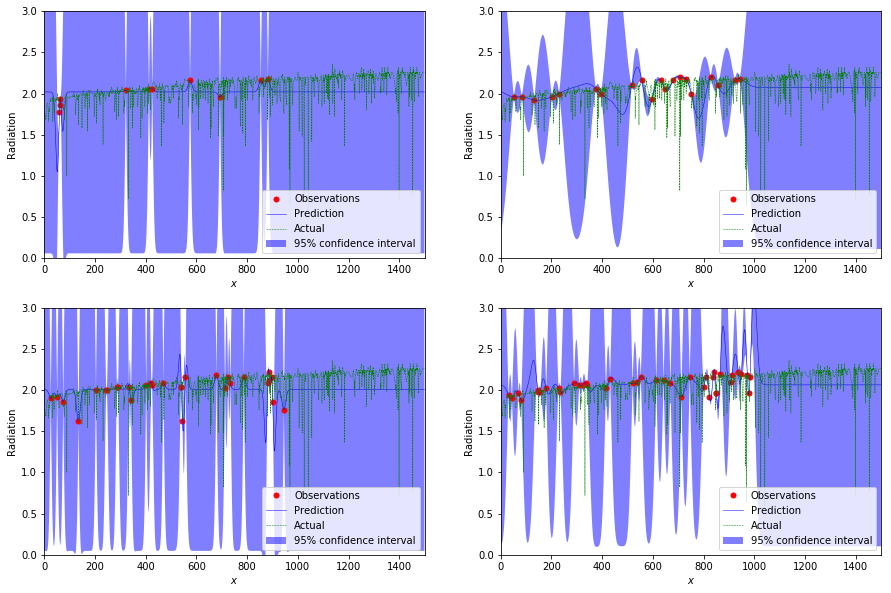

In [226]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF
from sklearn.metrics import r2_score
import random 

kernel = RBF(10, (1e-2, 1e2))



fig = plt.figure(figsize=(15,10))

for i in [1,2,3,4]:
    
    plt.subplot(2,2, i)

    gp = GaussianProcessRegressor(kernel=kernel, normalize_y=True, n_restarts_optimizer=10)

    radiation_random_indices = np.random.choice(radiation_X_train.shape[0], i*10, replace=True)

    radiation_X_train_sample = radiation_X_train[radiation_random_indices]
    radiation_y_train_sample = radiation_y_train[radiation_random_indices]

    gp.fit(radiation_X_train_sample, radiation_y_train_sample)

    radiation_y_predict, sigma = gp.predict(radiation_X_all, return_std=True)
    
    score = r2_score( radiation_X[1000:1500].reshape(-1, 1), radiation_y_predict[1000:1500])
    
    print("For {} samples R^2 is: {}".format(i*10, score))

    radiation_y_predict = radiation_y_predict[:,0]
    plt.plot(radiation_X_train_sample, radiation_y_train_sample, 'r.', markersize=10, label=u'Observations')
    plt.plot(radiation_X_all, radiation_y_predict, 'b-', label=u'Prediction')
    plt.plot(radiation_X_all, radiation_X[:1500].reshape(-1, 1), 'g--', label='Actual')
    plt.fill(np.concatenate([radiation_X_all, radiation_X_all[::-1]]),
             np.concatenate([radiation_y_predict - 1.9600 * sigma,
                            (radiation_y_predict + 1.9600 * sigma)[::-1]]),
             alpha=.5, fc='b', ec='None', label='95% confidence interval')
    plt.xlabel('$x$')
    plt.ylabel('Radiation')
    plt.legend(loc='lower right')
    plt.ylim(0,3)
    plt.xlim(0,1500)
    
    
plt.show();

The addition of more training points reduces the uncertainty of the gaussian process. However, how much uncertainity is reduced is heaviliy dependent on the which random points have been picked. For instance, the points picked for the top right graph result in an overfit around $x = 700$. 

When training the Guassian regressor on the full dataset this is wat we observe: 


R^2 is: -0.6343901977049582


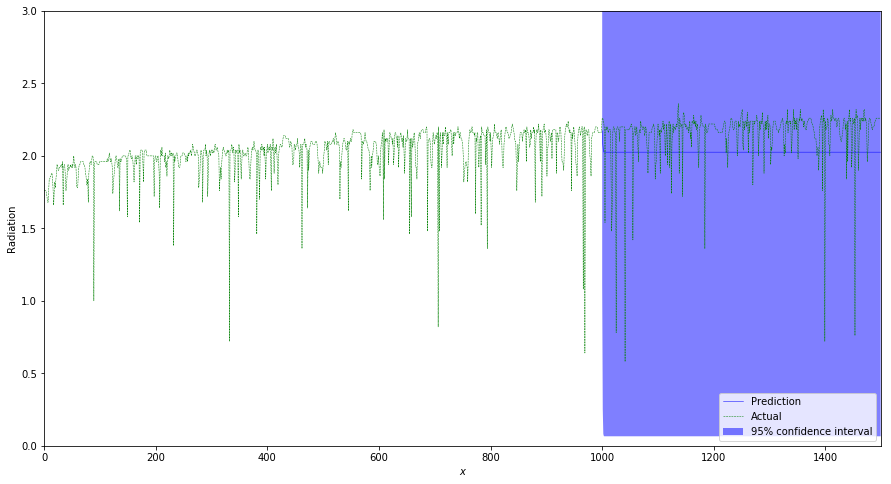

In [194]:
gp = GaussianProcessRegressor(kernel=kernel, normalize_y=True, n_restarts_optimizer=10)

gp.fit(radiation_X_train, radiation_y_train)

radiation_y_predict, sigma = gp.predict(radiation_X_test, return_std=True)

score = r2_score( radiation_y_test, radiation_y_predict)

print("R^2 is: {}".format(score))

fig = plt.figure(figsize=(15,8))

radiation_y_predict = radiation_y_predict[:,0]
plt.plot(radiation_X_test, radiation_y_predict, 'b-', label=u'Prediction')
plt.plot(radiation_X_all, radiation_X[:1500].reshape(-1, 1), 'g--', label='Actual')
plt.fill(np.concatenate([radiation_X_test, radiation_X_test[::-1]]),
         np.concatenate([radiation_y_predict - 1.9600 * sigma,
                        (radiation_y_predict + 1.9600 * sigma)[::-1]]),
         alpha=.5, fc='b', ec='None', label='95% confidence interval')
plt.xlabel('$x$')
plt.ylabel('Radiation')
plt.legend(loc='lower right')
plt.ylim(0,3)
plt.xlim(0,1500);

Training the Guassian process on the full training set shows that it overfits, and therefore exactly matches the curve as seen up until $x = 1000$. As the data here is noisy tuning alpha should lead to predictions that fit better, and hopefully have a better predictive value for $1000 < x \leq 1500$. 

R^2 is: -0.6342378598454383


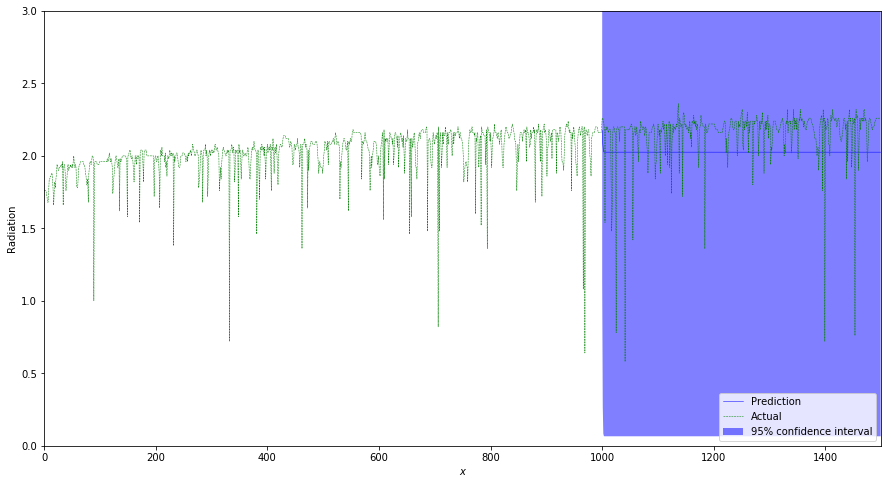

In [195]:
gp = GaussianProcessRegressor(kernel=kernel, normalize_y=True, n_restarts_optimizer=10, alpha=0.001)

gp.fit(radiation_X_train, radiation_y_train)

radiation_y_predict, sigma = gp.predict(radiation_X_test, return_std=True)

score = r2_score( radiation_y_test, radiation_y_predict)

print("R^2 is: {}".format(score))

fig = plt.figure(figsize=(15,8))

radiation_y_predict = radiation_y_predict[:,0]
plt.plot(radiation_X_test, radiation_y_predict, 'b-', label=u'Prediction')
plt.plot(radiation_X_all, radiation_X[:1500].reshape(-1, 1), 'g--', label='Actual')
plt.fill(np.concatenate([radiation_X_test, radiation_X_test[::-1]]),
         np.concatenate([radiation_y_predict - 1.9600 * sigma,
                        (radiation_y_predict + 1.9600 * sigma)[::-1]]),
         alpha=.5, fc='b', ec='None', label='95% confidence interval')
plt.xlabel('$x$')
plt.ylabel('Radiation')
plt.legend(loc='lower right')
plt.ylim(0,3)
plt.xlim(0,1500);

When setting `alpha` to account for nois in the data the kernel still does not extrapolate well. Therefore we combine the default `RBF` kernel with a linear kernel.  

R^2 is: -1.1464790218695837


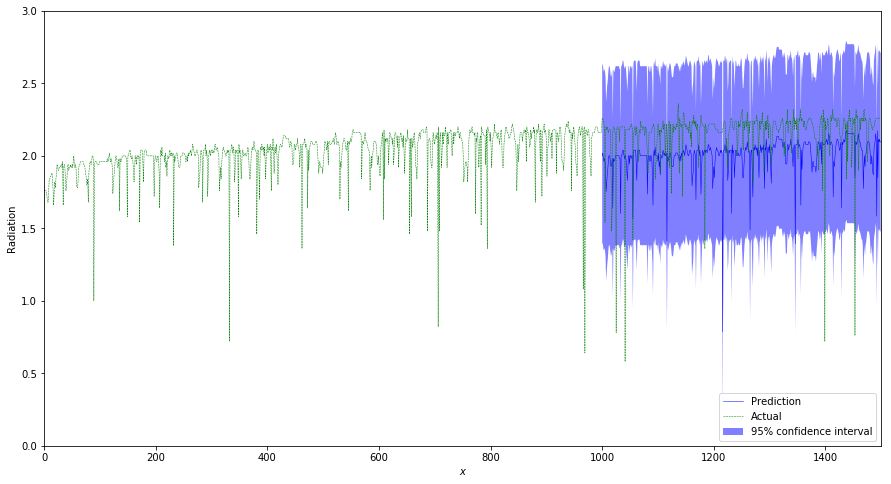

In [201]:
from sklearn.gaussian_process.kernels import ExpSineSquared, ConstantKernel

gp = GaussianProcessRegressor(kernel=ExpSineSquared(), normalize_y=True, n_restarts_optimizer=10, alpha=0.001)

gp.fit(radiation_X_train, radiation_y_train)

radiation_y_predict, sigma = gp.predict(radiation_X_test, return_std=True)

score = r2_score( radiation_y_test, radiation_y_predict)

print("R^2 is: {}".format(score))

fig = plt.figure(figsize=(15,8))

radiation_y_predict = radiation_y_predict[:,0]
plt.plot(radiation_X_test, radiation_y_predict, 'b-', label=u'Prediction')
plt.plot(radiation_X_all, radiation_X[:1500].reshape(-1, 1), 'g--', label='Actual')
plt.fill(np.concatenate([radiation_X_test, radiation_X_test[::-1]]),
         np.concatenate([radiation_y_predict - 1.9600 * sigma,
                        (radiation_y_predict + 1.9600 * sigma)[::-1]]),
         alpha=.5, fc='b', ec='None', label='95% confidence interval')
plt.xlabel('$x$')
plt.ylabel('Radiation')
plt.legend(loc='lower right')
plt.ylim(0,3)
plt.xlim(0,1500);

This kernel appears to match the data better, however, it still suffers from a systematic bias which we do not know how to resolve. However, tuning the kernels more should make it possible to account for the bias. 

## A data mining challenge (4 points)

The goal here is to use everything you have learned to build the best model for a given classification task. We will use two tasks hosted on OpenML, so you will all receive the same cross-validation splits, and your model will be evaluated on the server. The goal is to reasonably select algorithms and hyperparameter settings to obtain the best model. You can also do model selection, pipeline building, and parameter optimization as you have done before. Skeleton code is provided in the OpenML tutorial. You need to optimize the AUROC score (calculated using 10-fold cross0-validation).

- Challenge 1: Detects accents in speech data.

    - The OpenML Task ID is 167132: https://www.openml.org/t/167132
    - The dataset description can be found here: https://www.openml.org/d/40910
    - Leaderboard: https://www.openml.org/t/167132#!people
    
- Challenge 2: Image recognition (CIFAR-10 subsample).

    - The OpenML Task ID is 167133: https://www.openml.org/t/167133
    - The dataset description can be found here: https://www.openml.org/d/40926
    - Leaderboard: https://www.openml.org/t/167133#!people
    - Note that this is a high-dimensional dataset (and not so small). Think carefully about how to run experiments in the  time available.
    
- You are able to see the solutions of others (by clicking in the timeline or run list), so you can learn from prior experiments (what seems to work, how long does it take to train certain models, ...). Resubmission of the exact same solution is not possible.
- You can share one account (one API key) per team. In case you use two, we take the one that performs best.
- Document the different experiments that you ran in this notebook (running them can of course be done outside of the notebook). For each experiment, provide a description of how and why you chose the algorithms and parameters that you submitted. Reason about which experiments to try, don't just do an immense random search.
- Points are rewarded as follows (independently for each task):

    - 1 point for the breadth of experiments you ran (algorithms, pipelines, hyperparameter settings)
    - 1 point for reasoning/insight and interpretation of the results
    - 1 (bonus) point for every team who has uploaded the best solution thus far **on AUC** (who reaches the top of the leaderboard at any moment during the assignment)
        - Exception: simply repeating top models with nearly identical hyperparameters. This will be checked on the timeline.
        - Note: On the leaderboard page, the 'frontier' line is drawn, and your top ranking is also shown in the leaderboard.
        
Note: Report the AUC scores of your best models in your report as well. In case of issues with OpenML we will use the experiments and scores mentioned your report.

# Challenge 1

In [202]:
speech = oml.datasets.get_dataset(40910) 
# Get the predictors X and the target y
speechX, speechy, speech_attribute_names = speech.get_data(target=speech.default_target_attribute, return_attribute_names=True)
# Describe the data with pandas, just to get an overview
speech = pd.DataFrame(speechX, columns=speech_attribute_names)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV 
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import FeatureAgglomeration
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.decomposition import PCA
from sklearn.ensemble import GradientBoostingClassifier

In [43]:
speech.describe()

,V1,V2,V3,V4,...,V397,V398,V399,V400
count,3686.00,3686.00,3686.00,3686.00,...,3686.00,3686.00,3686.00,3686.00
mean,-0.19,0.11,0.22,0.21,...,0.44,0.59,-0.06,0.13
std,0.90,0.90,0.94,0.90,...,0.87,0.87,0.93,0.92
min,-3.47,-3.72,-3.88,-3.22,...,-2.54,-2.67,-4.10,-3.30
25%,-0.79,-0.50,-0.40,-0.39,...,-0.13,0.01,-0.67,-0.49
50%,-0.17,0.11,0.23,0.22,...,0.45,0.60,-0.07,0.15
75%,0.41,0.71,0.86,0.79,...,0.99,1.18,0.56,0.73
max,3.36,3.52,3.32,3.40,...,3.43,3.58,3.69,3.48


## Dimensionality reduction

Due to the large amount of features in the data-set we have first chosen to apply a dimensionality reduction technique. As not all classifiers work well on high dimensional data-sets. The reduction technique we have chosen is PCA, as this tries to maintain the structure of the dataset. 

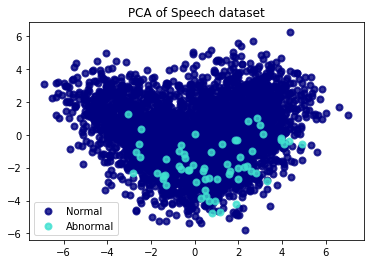

In [6]:
pca = PCA(n_components=2)

speechX_pca = pca.fit(speechX).transform(speechX)

plt.figure()
colors = ['navy', 'turquoise']
lw = 2

for color, i, target_name in zip(colors, [0, 1], ['Normal', 'Abnormal']):
    plt.scatter(speechX_pca[speechy == i, 0], speechX_pca[speechy == i, 1], color=color, alpha=.8, lw=lw,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA of Speech dataset')

plt.show();

When reducing the Speech data to two dimensions it becomes clear that in very low dimensional spaces there is no clear division between the two classes. However, for 2D it is clear that abnormal patterns are clustered in a smaller area. 

To investigate how well classification works on the speech data reduced with PCA we have attempted to fit a logistic regressor to the speech data. This reggressor without any optimizations appers to score decent scores. 

In [46]:
linReg = LogisticRegression()

scores = cross_val_score(linReg, speechX_pca, speechy, cv=10,scoring="roc_auc")

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [0.889 0.983 0.971 0.962 0.898 0.785 0.664 0.627 0.308 0.591]
Mean 0.767682910035999


In [47]:
pipe = Pipeline([("scaler", StandardScaler()), ("reg", LogisticRegression())])

scores = cross_val_score(pipe, speechX_pca, speechy, cv=10,scoring="roc_auc")

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [0.889 0.983 0.971 0.962 0.899 0.782 0.663 0.627 0.31  0.589]
Mean 0.767445894693509


In [48]:
param_grid_log_reg = {'reg__C': np.logspace(-5, 2, num=40)}

pipe_log_reg = Pipeline([("reg", LogisticRegression(n_jobs=-1))])

grid_search_log_reg = GridSearchCV(pipe_log_reg, param_grid_log_reg, cv=10, scoring="roc_auc")

_=grid_search_log_reg.fit(speechX_pca, speechy)

print(grid_search_log_reg.best_score_)

0.7703483771292846


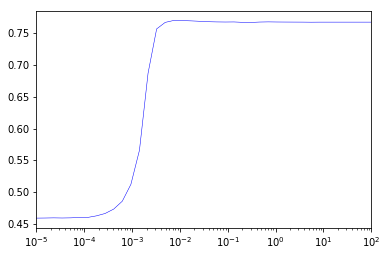

In [49]:
results_log_reg_c= pd.DataFrame(grid_search_log_reg.cv_results_)

scores_log_reg_c = np.array(results_log_reg_c.mean_test_score)

_=plt.plot(param_grid_log_reg['reg__C'], scores_log_reg_c, 'b')
_=plt.xscale('log')
_=plt.xlim([0.00001, 100])
plt.show()

Further optimization of the `C` parameter shows that there is quite a significant performance gain when applying less regularization, our next idea was also tuning hyperparameters for the dimensionality reduction. 

### Adding PCA to the pipeline

In [232]:
pipe = Pipeline([("pca", PCA()), ("reg", LogisticRegression(n_jobs=-1))])

scores = cross_val_score(pipe, speechX, speechy, cv=10,scoring="roc_auc")

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [0.836 0.662 0.855 0.905 0.787 0.536 0.642 0.326 0.484 0.454]
Mean 0.6487246722806743


In [233]:
param_grid_pca_log_reg = {'reg__C': np.around(np.logspace(-5, 2, num=20),decimals=5), "pca__n_components": [2,4,6,8,10, 12, 14]}

pipe_pca_log_reg = Pipeline([("scaler", StandardScaler()), ("pca", PCA()), ("reg", LogisticRegression(n_jobs=-1))])

grid_search_pca_log_reg = GridSearchCV(pipe_pca_log_reg, param_grid_pca_log_reg, cv=10, scoring="roc_auc")

_=grid_search_pca_log_reg.fit(speechX, speechy)

print(grid_search_pca_log_reg.best_score_)

0.8479264429407546


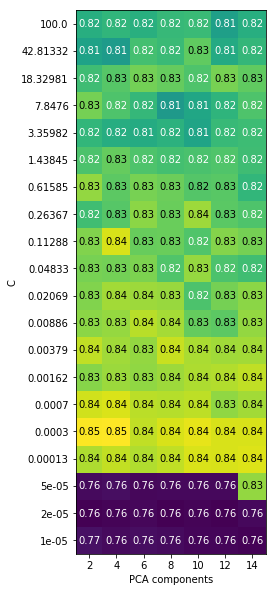

In [234]:
results_pca_pipe = pd.DataFrame(grid_search_pca_log_reg.cv_results_)

scores_pca_pipe = np.array(results_pca_pipe.mean_test_score).reshape(param_grid_pca_log_reg['reg__C'].size, len(param_grid_pca_log_reg['pca__n_components']))
# plot the mean cross-validation scores
plt.figure(figsize=(10,10))
mglearn.tools.heatmap(scores_pca_pipe, xlabel='PCA components', xticklabels=param_grid_pca_log_reg['pca__n_components'],
                      ylabel='C', yticklabels=param_grid_pca_log_reg['reg__C'], cmap="viridis");

In [16]:
param_grid_pca_log_reg = {'reg__C': np.around(np.logspace(-5, 2, num=10),decimals=5), "pca__n_components": [2,4,8,10],
                             'reg__solver': ['liblinear', 'newton-cg', 'lbfgs', 'sag']}

pipe_pca_log_reg = Pipeline([("scaler", StandardScaler()), ("pca", PCA()), ("reg", LogisticRegression(n_jobs=-1))])

grid_search_pca_log_reg = GridSearchCV(pipe_pca_log_reg, param_grid_pca_log_reg, cv=10, scoring="roc_auc")

_=grid_search_pca_log_reg.fit(speechX, speechy)

print("Score: {}, with params: {}".format(grid_search_pca_log_reg.best_score_, grid_search_pca_log_reg.best_params_))

Score: 0.8479176092384254, with params: {'reg__solver': 'newton-cg', 'reg__C': 0.07743, 'pca__n_components': 4}


Tweaking the hyperparameters of both PCA and the classifier led to good results which we published to OpenML. 

In [8]:
task = oml.tasks.get_task(167132)
clf = grid_search_pca_log_reg.best_estimator_
flow = oml.flows.sklearn_to_flow(clf)
run = oml.runs.run_flow_on_task(task, flow)
run.model
myrun = run.publish()

Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('pca', PCA(copy=True, iterated_power='auto', n_components=4, random_state=5740,
  svd_solver='auto', tol=0.0, whiten=False)), ('reg', LogisticRegression(C=0.04833, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='ovr', n_jobs=-1, penalty='l2', random_state=43271,
          solver='liblinear', tol=0.0001, verbose=0, warm_start=False))])

In [63]:
from sklearn.linear_model import ElasticNet

pipe = Pipeline([("pca", PCA()), ("reg", ElasticNet())])

scores = cross_val_score(pipe, speechX, speechy, cv=10)

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [-0.198  0.     0.     0.     0.     0.     0.     0.     0.     0.   ]
Mean -0.019805194805194846


Using another kind of classifier led to abysmal results, even with dimensionality scaling. 

In [11]:
pipe = Pipeline([("pca", PCA()), ("reg", GradientBoostingClassifier())])

scores = cross_val_score(pipe, speechX, speechy, cv=10, scoring="roc_auc")

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [0.556 0.929 0.864 0.882 0.933 0.659 0.407 0.577 0.338 0.495]
Mean 0.6641151415134338


In [9]:
def GradientBoostingGridSearch(grid):
    pipe_pca_gb = pipe = Pipeline([("pca", PCA()), ("clf", GradientBoostingClassifier())])

    grid_search_pca_gb = GridSearchCV(pipe_pca_gb, grid, cv=10, scoring="roc_auc", n_jobs=-1)

    _=grid_search_pca_gb.fit(speechX, speechy)

    print("Score: {}, with params: {}".format(grid_search_pca_gb.best_score_, grid_search_pca_gb.best_params_))

In [77]:
param_grid_pca_gb = {"clf__n_estimators": np.linspace(20, 400, num=10).astype(np.int32), 
                     "pca__n_components": [2,5,10,15,25,40,60]}

GradientBoostingGridSearch(param_grid_pca_gb)

Score: 0.7851273879335453, with params: {'clf__n_estimators': 273, 'pca__n_components': 15}


In [12]:
param_grid_pca_gb_refined = {"clf__n_estimators": [273], 
                     "pca__n_components": [15],
                            "clf__max_depth": [1,2,4,5,7,10],
                            "clf__min_samples_split": np.linspace(1/400, 30/400, num=4),
                            "clf__learning_rate": np.linspace(0.001, 0.5, num =5)}

GradientBoostingGridSearch(param_grid_pca_gb_refined)

Score: 0.7875375340328181, with params: {'clf__n_estimators': 273, 'clf__max_depth': 1, 'clf__learning_rate': 0.12575, 'pca__n_components': 15, 'clf__min_samples_split': 0.0025}


Using a heavily tuned ensemble classifier on hte low dimensional space does not appear to work quite as well as the logistic regression. 

In [74]:
pipe = Pipeline([("pca", PCA()), ("reg", RandomForestClassifier())])

scores = cross_val_score(pipe, speechX, speechy, cv=10, scoring="roc_auc")

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [0.376 0.496 0.53  0.478 0.682 0.66  0.505 0.581 0.506 0.52 ]
Mean 0.5334311852832697


In [79]:
param_grid_pca_rf = {"clf__n_estimators": np.linspace(20, 800, num=10).astype(np.int32), 
                     "pca__n_components": [2,5,10,15,25,40,60]}

pipe_pca_rf = pipe = Pipeline([("pca", PCA()), ("clf", RandomForestClassifier(n_jobs=-1))])

grid_search_pca_rf = GridSearchCV(pipe_pca_rf, param_grid_pca_rf, cv=10, scoring="roc_auc")

_=grid_search_pca_rf.fit(speechX, speechy)

print("Score: {}, with params: {}".format(grid_search_pca_rf.best_score_, grid_search_pca_rf.best_params_))

Score: 0.7470747802752881, with params: {'clf__n_estimators': 400, 'pca__n_components': 5}


And even a different ensemble based technique does not score quite as well as the logistic regression. 

## Original data

In addition to using dimensionality reduction we have also chosen to apply and tune ensemble based classifiers on the original, non-reduced. Dataset. We have chosen not to using scaling for these classifiers as this is not needed with tree based classifiers. 

In [17]:
from sklearn.ensemble import GradientBoostingClassifier

pipe = Pipeline([("reg", GradientBoostingClassifier())])

scores = cross_val_score(pipe, speechX, speechy, cv=10, scoring="roc_auc")

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [0.551 0.748 0.581 0.737 0.785 0.736 0.313 0.641 0.55  0.394]
Mean 0.6034836508153937


In [10]:
randomForest = RandomForestClassifier(32, max_depth=10)

scores = cross_val_score(randomForest, speechX, speechy, cv=10,scoring="roc_auc")

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [0.556 0.761 0.489 0.392 0.813 0.557 0.331 0.453 0.552 0.509]
Mean 0.5413413390560552


In [47]:
param_grid = {'n_estimators': np.logspace(5, 9, num=8,base=2).astype(np.int32), 
              'max_depth': np.linspace(1, 251, num=5).astype(np.int32)}

grid_search = GridSearchCV(RandomForestClassifier(n_jobs=-1), param_grid, cv=10,scoring="roc_auc")

grid_search.fit(speechX, speechy)

print(grid_search.best_score_)

GridSearchCV(cv=10, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': array([  1,  63, 126, 188, 251]), 'n_estimators': array([ 32,  47,  70, 105, 156, 231, 344, 512])},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=0)

0.639229523167431


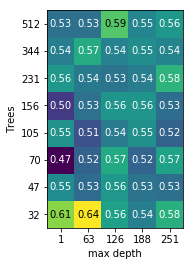

In [48]:
results_rnd_forest = pd.DataFrame(grid_search.cv_results_)

scores_rnd_forest = np.array(results_rnd_forest.mean_test_score).reshape(param_grid['n_estimators'].size, param_grid['max_depth'].size)
# plot the mean cross-validation scores
mglearn.tools.heatmap(scores_rnd_forest, xlabel='max depth', xticklabels=param_grid['max_depth'],
                      ylabel='Trees', yticklabels=param_grid['n_estimators'], cmap="viridis");

In addition to using ensemble based classifiers we have also tried logistic regression again. However, the tuned logistic regression scored lower than the logistic regression with PCA. 

In [6]:
linReg = LogisticRegression()

scores = cross_val_score(linReg, speechX, speechy, cv=10,scoring="roc_auc")

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [0.778 0.813 0.932 0.882 0.784 0.551 0.581 0.385 0.356 0.337]
Mean 0.6398059666768857


In [7]:
pipe = Pipeline([("scaler", StandardScaler()), ("reg", LogisticRegression())])

scores = cross_val_score(pipe, speechX, speechy, cv=10,scoring="roc_auc")

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [0.835 0.657 0.853 0.904 0.785 0.527 0.639 0.324 0.486 0.45 ]
Mean 0.6459849626348874


In [22]:
param_grid_log_reg = {'reg__C': np.logspace(-5, 2, num=20)}

pipe_log_reg = Pipeline([("scaler", StandardScaler()), ("reg", LogisticRegression(n_jobs=-1))])

grid_search_log_reg = GridSearchCV(pipe_log_reg, param_grid_log_reg, cv=10, scoring="roc_auc")

_=grid_search_log_reg.fit(speechX, speechy)

print(grid_search_log_reg.best_score_)

0.7881421744275285


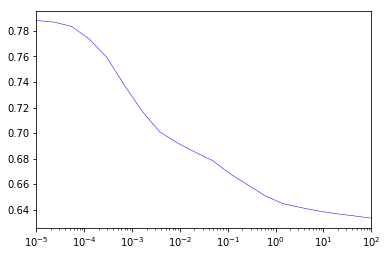

In [23]:
results_log_reg_c= pd.DataFrame(grid_search_log_reg.cv_results_)

scores_log_reg_c = np.array(results_log_reg_c.mean_test_score)

_=plt.plot(param_grid_log_reg['reg__C'], scores_log_reg_c, 'b')
_=plt.xscale('log')
_=plt.xlim([0.00001, 100])
plt.show()

In [8]:
task = oml.tasks.get_task(167132)
clf = Pipeline([("scaler", StandardScaler()), ("reg", LogisticRegression())])
flow = oml.flows.sklearn_to_flow(clf)
run = oml.runs.run_flow_on_task(task, flow)
run.model
myrun = run.publish()

Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('reg', LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=62728, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False))])

As each of the features is slightly differently distributed we have chosen to use a pipeline with the standard scaler. With the scaler we get a mean area under roc score of 0.6459

In [24]:
task = oml.tasks.get_task(167132)
clf = grid_search_log_reg.best_estimator_
flow = oml.flows.sklearn_to_flow(clf)
run = oml.runs.run_flow_on_task(task, flow)
run.model
myrun = run.publish()

Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('reg', LogisticRegression(C=1e-05, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=-1,
          penalty='l2', random_state=27814, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False))])

In [20]:
clf = KNeighborsClassifier()

scores = cross_val_score(clf, speechX, speechy, cv=10,scoring="roc_auc")

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [0.606 0.716 0.653 0.496 0.92  0.725 0.7   0.581 0.765 0.691]
Mean 0.6852117628172375


In [28]:
param_grid = {'clf__n_neighbors': [19, 21, 23], "clf__weights" : ["uniform", "distance"]}

pipe = Pipeline([("clf", KNeighborsClassifier())])

grid_search= GridSearchCV(pipe, param_grid, cv=10, scoring="roc_auc", n_jobs=-1)

_=grid_search.fit(speechX, speechy)

print("Score {} with params {}".format(grid_search.best_score_, grid_search.best_params_))

Score 0.8306373660425861 with params {'clf__n_neighbors': 23, 'clf__weights': 'distance'}


Finally we have found that heavily tuning KNN classifier leads to good results as well, almost as high as using PCA and logistic regression. 

### Voting

Experience learns that we have some classifiers with high scores, can we combine to reach an even higher score?

In [212]:
reg_pipe = Pipeline([
    ("scaler", StandardScaler()), 
    ("pca", PCA(n_components=4)), 
    ("reg", LogisticRegression(n_jobs=-1, C=0.07743, solver='newton-cg'))])

knn = KNeighborsClassifier(n_neighbors=23, weights="distance")


clf = VotingClassifier(estimators=[('lr', reg_pipe), ("knn", knn)], voting='soft', n_jobs=-1)

scores = cross_val_score(clf, speechX, speechy, cv=10,scoring="roc_auc")

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()));


Cross-validation scores random forest regression: [0.89  0.964 0.977 0.898 0.84  0.914 0.821 0.689 0.774 0.77 ]
Mean 0.8537036976640191


In [211]:
task = oml.tasks.get_task(167132)
clf = clf
flow = oml.flows.sklearn_to_flow(clf)
run = oml.runs.run_flow_on_task(task, flow)
run.model
myrun = run.publish();

KeyboardInterrupt: 

In [213]:
reg_pipe = Pipeline([("scaler", StandardScaler()), ("pca", PCA(n_components=4)), ("reg", LogisticRegression(n_jobs=-1, C=0.07743, solver='newton-cg'))])
knn = KNeighborsClassifier(21)
gb = Pipeline([ ("clf", GradientBoostingClassifier(
                    n_estimators=273, max_depth=1,learning_rate=12575, min_samples_split=.0025))])


clf = VotingClassifier(estimators=[('lr', reg_pipe), ("knn", knn), ("gb", gb)], voting='soft', n_jobs=-1)

scores = cross_val_score(clf, speechX, speechy, cv=10, scoring="roc_auc")

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()));



Cross-validation scores random forest regression: [0.891 0.96  0.983 0.913 0.853 0.892 0.765 0.658 0.778 0.793]
Mean 0.848663284926469


In [21]:
task = oml.tasks.get_task(167132)
clf = clf
flow = oml.flows.sklearn_to_flow(clf)
run = oml.runs.run_flow_on_task(task, flow)
run.model
myrun = run.publish()

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but i

VotingClassifier(estimators=[('lr', Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('pca', PCA(copy=True, iterated_power='auto', n_components=4, random_state=3521,
  svd_solver='auto', tol=0.0, whiten=False)), ('reg', LogisticRegression(C=0.07743, class_weight...  presort='auto', random_state=25798, subsample=1.0, verbose=0,
              warm_start=False))]))],
         flatten_transform=None, n_jobs=-1, voting='hard', weights=None)

For us VotingClassifiers eventually led to the highest score. This by combining two wildly different techniques (KNN and PCA + logistic regression) and letting the voting classifier combine the two 50/50 using soft voting. 

# Challenge 2

Due to the size and dimensionality of the second problem we have not performed the same extensive investigation into classifiers for this problem. Additionally, we have run into problems locally computing the auc roc score because of the fact that this is a multiclass problem. 

Therefore, we have instead used predictive accuracy as a benchmark of auc roc score. Additionally, because of the many entries we have used stratified subsamples to test different classifiers. 

In [236]:
cifar = oml.datasets.get_dataset(40926) 
# Get the predictors X and the target y
cifarX, cifary, cifar_attribute_names = cifar.get_data(target=cifar.default_target_attribute, return_attribute_names=True)
# Describe the data with pandas, just to get an overview
cifar = pd.DataFrame(cifarX, columns=cifar_attribute_names)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV 
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

In [15]:
cifar.describe()

,a0,a1,a2,a3,...,a3068,a3069,a3070,a3071
count,20000.00,20000.00,20000.00,20000.00,...,20000.00,20000.00,20000.00,20000.00
mean,131.27,130.66,131.67,132.50,...,114.46,114.48,114.55,115.22
std,73.54,72.60,72.39,71.97,...,64.76,64.97,65.42,66.25
min,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00
25%,71.00,71.00,73.00,74.00,...,64.00,64.00,64.00,64.00
50%,128.00,127.00,129.00,130.00,...,106.00,106.00,106.00,106.00
75%,190.00,189.00,190.00,190.00,...,158.00,159.00,159.00,160.00
max,255.00,255.00,255.00,255.00,...,255.00,255.00,255.00,255.00


### Linear regression

In [20]:
from sklearn.model_selection import train_test_split

sub_cifarX, a, sub_cifary,b = train_test_split(cifarX, cifary, train_size=0.1, stratify = cifary)


clf = LogisticRegression(n_jobs=-1)

scores = cross_val_score(clf, sub_cifarX, sub_cifary, cv=10)

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [0.229 0.27  0.208 0.17  0.266 0.291 0.286 0.222 0.239 0.208]
Mean 0.23899407632634634


In [238]:
from sklearn.model_selection import train_test_split

sub_cifarX, a, sub_cifary,b = train_test_split(cifarX, cifary, train_size=0.1, stratify = cifary)


clf = Pipeline([("pca", PCA()), ("reg",LogisticRegression(n_jobs=-1))])

scores = cross_val_score(clf, sub_cifarX, sub_cifary, cv=10, n_jobs=-1)

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))

Cross-validation scores random forest regression: [0.123 0.157 0.108 0.165 0.141 0.166 0.121 0.197 0.142 0.142]
Mean 0.14611554836948554


### Support vector machines

Due to the low predictive accuracy of logistic regression we have also attempted to use support vector machines. For us the best results were achieved by tweaking kernels and using a linear kernel. While the running times were high we eventually managed to upload a run to OpenML that combines scaling and SVMs. 

In [27]:
from sklearn.svm import SVC

sub_cifarX, a, sub_cifary,b = train_test_split(cifarX, cifary, train_size=0.1, stratify = cifary)

clf = SVC(kernel='rbf')

scores = cross_val_score(clf, sub_cifarX, sub_cifary, cv=10)

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))


Cross-validation scores random forest regression: [0.103 0.103 0.108 0.1   0.101 0.101 0.101 0.106 0.107 0.107]
Mean 0.10350228504698251


In [28]:
from sklearn.svm import SVC

sub_cifarX, a, sub_cifary,b = train_test_split(cifarX, cifary, train_size=0.1, stratify = cifary)

clf = SVC(kernel='linear')

scores = cross_val_score(clf, sub_cifarX, sub_cifary, cv=10)

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))


Cross-validation scores random forest regression: [0.353 0.289 0.281 0.27  0.271 0.342 0.317 0.278 0.269 0.305]
Mean 0.2973975119982513


In [36]:
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

sub_cifarX, a, sub_cifary,b = train_test_split(cifarX, cifary, train_size=0.01, stratify = cifary)

clf = Pipeline([("scaler", StandardScaler()) ,("clf",SVC(kernel='linear'))])

scores = cross_val_score(clf, sub_cifarX, sub_cifary, cv=10)

print("Cross-validation scores random forest regression: {}".format(scores))
print("Mean {}".format(scores.mean()))


Cross-validation scores random forest regression: [0.2  0.4  0.15 0.3  0.45 0.2  0.3  0.4  0.45 0.2 ]
Mean 0.30500000000000005


In [69]:
task = oml.tasks.get_task(167133)
flow = oml.flows.sklearn_to_flow(clf)
run = oml.runs.run_flow_on_task(task, flow)
run.model
myrun = run.publish()

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=17013, subsample=1.0, verbose=0,
              warm_start=False)